# About this Notebook

The purpose of this notebook is to study a convolutional network solution. The MLP performs well when the validation/test is on the same flight as the training, however it does not generalize well to other flights. We will therefore try to use a new architecture able to detect more complex pattern in the data : a convolutional network. See previous notebook for more details

# Table of Contents

# Import packages

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tabulate import tabulate
from tqdm.notebook import tqdm_notebook
import random
import magnav
import os
from ipywidgets import widgets
from torchinfo import summary
import ast
from matplotlib.collections import LineCollection
import joblib
import matplotlib.pyplot as plt
import matplotlib.animation
import shap

In [3]:
# Reproducibility
torch.manual_seed(27)
random.seed(27)
np.random.seed(27)

# 1 - What is a Convolutional Neural Network <a class="anchor" id = "1"></a>

A convolutional neural network (CNN, or ConvNet) is a class of artificial neural network (ANN), most commonly applied to analyze visual imagery. Convolutional neural network are a specialized type of artificial neural networks that use a mathematical operation called convolution in place of general matrix multiplication in at least one of their layers. CNN are often compared to the way the brain achieves vision processing in living organisms.

Typical architecture of a convolutional neural network:

<img src="../data/external/Images/CNN.jpeg" alt="CNN" width="700"/>

A convolutional neural network consits of an input layer, hidden layers and an output layer. In a CNN, the hidden layers include layers that perform convolutions. Typically this includes a layer that performs a dot product of the convolution kernel with the layer's input matrix. This product is usually the [Frobenius inner product](https://en.wikipedia.org/wiki/Frobenius_inner_product), and its activattion function is commonly [ReLU](https://en.wikipedia.org/wiki/Rectifier_(neural_networks). As the convolution kernel slides along the input matrix for the layer, the convolution operation generates a feature map, which in turn contributes to the input of the next layer. This is followed by other layers such as pooling layers, fully connected layers, and normalization layers.

<font size='3'><b>Convolutional layers</b></font>

Convolutional layer convolve the input and pass its result to the next layer. This is similar to the response of a neuron in the visual cortex to a specific stimulus. After passing through a convolutional layer, the image becomes abstracted to a feature map, also called an activation map :

<img src="../data/external/Images/2D_Convolution_Animation.gif" alt="CNN" width="300"/>

<font size='3'><b>Pooling layers</b></font>

Pooling layers reduce the dimensions of data by combining the outputs of neuron clusters at one layer into a single neuron in the next layer. Local pooling combines small clusters, tilling sizes such as 2x2 are commonly used. Global pooling acts on all the neurons of the feature map. There are two common types of pooling in popular use :
- Max pooling uses the maximum value of each local cluster of neurons in the feature map
- Average pooling takes the average value of each local cluster of neurons in the feature map

Here is an expemple of Max Pooling :

<img src="../data/external/Images/Max_Pooling_GIFg.gif" alt="CNN" width="300"/>

## Specifity of time-series data for CNN

In our case we have *multivariate* time series data. This mean that there is more than one observation for each time step. We are trying to create a model able to use a sequence of multiple input series and output one time series dependant on the input time series. The input time series are parallel because each series has observations at the same time steps.

# 2 - Import of Data

In [4]:
df2 = pd.read_hdf('../data/processed/Chall_dataset.h5', key=f'Flt1002')
df3 = pd.read_hdf('../data/processed/Chall_dataset.h5', key=f'Flt1003')
df4 = pd.read_hdf('../data/processed/Chall_dataset.h5', key=f'Flt1004')
df5 = pd.read_hdf('../data/processed/Chall_dataset.h5', key=f'Flt1005')
df6 = pd.read_hdf('../data/processed/Chall_dataset.h5', key=f'Flt1006')
df7 = pd.read_hdf('../data/processed/Chall_dataset.h5', key=f'Flt1007')

In [5]:
sections = np.concatenate([df2.LINE.unique(),df3.LINE.unique(),df4.LINE.unique()]).tolist()
sections.remove(1002.14)
print(sections)

[1002.01, 1002.02, 1002.03, 158.0, 1002.04, 160.0, 1002.05, 1367.0, 1002.06, 1368.0, 1002.07, 1369.0, 1002.08, 3084.0, 1002.09, 3085.0, 1002.1, 3086.0, 1002.11, 1002.13, 1002.15, 1002.16, 1002.17, 1002.18, 1002.19, 1002.2, 1002.21, 1003.01, 1003.02, 1003.03, 1003.04, 1003.05, 1003.06, 1003.07, 1003.08, 1003.09, 1003.11, 1004.01, 4019.0, 4018.0, 4017.0, 4016.0, 421.0, 419.0, 417.0, 415.0, 413.0, 411.0, 409.0, 408.0, 407.0, 405.0, 403.0, 401.0, 4015.0, 4012.0, 4001.0, 1004.02]


In [6]:
df2.head()

,TL_comp_mag3_cl,TL_comp_mag5_cl,V_BAT1,V_BAT2,INS_ACC_X,INS_ACC_Y,INS_ACC_Z,CUR_IHTR,PITCH,ROLL,AZIMUTH,LINE,IGRFMAG1
Time [s],,,,,,,,,,,,,
45100.0,-1027.172863,-44.913237,25.827,2.015,-0.109544,-0.389939,9.353474,1.734,9.19,0.19,204.01,1002.01,-297.343
45100.1,-1023.423476,-40.530743,25.826,2.014,-0.157305,-0.441169,9.317263,1.759,9.08,-0.03,203.95,1002.01,-296.223
45100.2,-1021.676704,-34.747879,25.824,2.013,-0.179486,-0.462637,9.348927,1.783,8.96,-0.22,203.91,1002.01,-295.079
45100.3,-1024.353002,-29.277597,25.820,2.010,-0.208515,-0.496153,9.333830,1.796,8.85,-0.39,203.90,1002.01,-293.939
45100.4,-1031.087142,-25.351508,25.815,2.007,-0.252133,-0.507891,9.261835,1.788,8.73,-0.55,203.91,1002.01,-292.821


# 3 - Data Scaling

In [7]:
df2.describe()

,TL_comp_mag3_cl,TL_comp_mag5_cl,V_BAT1,V_BAT2,INS_ACC_X,INS_ACC_Y,INS_ACC_Z,CUR_IHTR,PITCH,ROLL,AZIMUTH,LINE,IGRFMAG1
count,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000
mean,-669.475213,252.205967,25.611898,1.619617,-0.015783,-0.003712,9.802150,3.848259,3.158681,0.713577,198.991432,1152.355312,15.822918
std,314.024716,259.940342,0.029348,0.472861,0.888905,0.851953,0.839888,0.960830,2.149178,6.935455,96.748747,603.633030,263.641503
min,-6482.118328,-624.217444,25.565000,0.721000,-4.634218,-5.039006,1.656503,1.197000,-7.980000,-23.790000,0.000000,158.000000,-868.652000
25%,-816.250528,135.722802,25.598000,1.236000,-0.278982,-0.237660,9.458989,3.212000,2.010000,-1.380000,135.582500,1002.030000,-106.787250
50%,-673.108724,254.414638,25.608000,1.405000,-0.006206,0.000238,9.803378,3.723000,3.030000,0.400000,183.010000,1002.150000,24.219500
75%,-520.790491,348.645526,25.618000,2.047000,0.263415,0.236629,10.154456,4.374000,4.130000,2.260000,289.470000,1002.200000,120.868500
max,3893.472858,2878.672361,25.828000,2.671000,5.912657,5.361966,17.052216,6.644000,10.540000,30.080000,360.000000,3086.000000,2699.331000


## 3.1 - MinMax Scaling

In [8]:
scaling_range = [-1,1]
MinMaxScaler_2 = MinMaxScaler(scaling_range)
MinMaxScaler_3 = MinMaxScaler(scaling_range)
MinMaxScaler_4 = MinMaxScaler(scaling_range)
MinMaxScaler_7 = MinMaxScaler(scaling_range)


df2_minmax = pd.DataFrame()
df3_minmax = pd.DataFrame()
df4_minmax = pd.DataFrame()
df7_minmax = pd.DataFrame()


df2_minmax[df2.drop(columns=['LINE']).columns] = MinMaxScaler_2.fit_transform(df2.drop(columns=['LINE']))
df3_minmax[df3.drop(columns=['LINE']).columns] = MinMaxScaler_3.fit_transform(df3.drop(columns=['LINE']))
df4_minmax[df4.drop(columns=['LINE']).columns] = MinMaxScaler_4.fit_transform(df4.drop(columns=['LINE']))
df7_minmax[df4.drop(columns=['LINE']).columns] = MinMaxScaler_7.fit_transform(df7.drop(columns=['LINE']))


df2_minmax.index = df2.index
df3_minmax.index = df3.index
df4_minmax.index = df4.index
df7_minmax.index = df7.index


df2_minmax[['LINE']] = df2[['LINE']]
df3_minmax[['LINE']] = df3[['LINE']]
df4_minmax[['LINE']] = df4[['LINE']]
df7_minmax[['LINE']] = df7[['LINE']]


df2_minmax.describe()

,TL_comp_mag3_cl,TL_comp_mag5_cl,V_BAT1,V_BAT2,INS_ACC_X,INS_ACC_Y,INS_ACC_Z,CUR_IHTR,PITCH,ROLL,AZIMUTH,IGRFMAG1,LINE
count,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000,207578.000000
mean,0.120446,-0.499600,-0.643363,-0.078342,-0.124208,-0.031765,0.058171,-0.026525,0.202881,-0.090270,0.105508,-0.504216,1152.355312
std,0.060531,0.148415,0.223182,0.484986,0.168563,0.163822,0.109107,0.352792,0.232093,0.257489,0.537493,0.147782,603.633030
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,158.000000
25%,0.092153,-0.566107,-0.749049,-0.471795,-0.174118,-0.076751,0.013592,-0.260143,0.078834,-0.167997,-0.246764,-0.572944,1002.030000
50%,0.119745,-0.498339,-0.673004,-0.298462,-0.122392,-0.031005,0.058330,-0.072517,0.188985,-0.101912,0.016722,-0.499509,1002.150000
75%,0.149106,-0.444537,-0.596958,0.360000,-0.071264,0.014450,0.103938,0.166514,0.307775,-0.032857,0.608167,-0.445333,1002.200000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3086.000000


## 3.2 - Standard Scaling

In [9]:
StandardScaler_2 = StandardScaler()
StandardScaler_3 = StandardScaler()
StandardScaler_4 = StandardScaler()
StandardScaler_7 = StandardScaler()


df2_standard = pd.DataFrame()
df3_standard = pd.DataFrame()
df4_standard = pd.DataFrame()
df7_standard = pd.DataFrame()


df2_standard[df2.drop(columns=['LINE']).columns] = StandardScaler_2.fit_transform(df2.drop(columns=['LINE']))
df3_standard[df3.drop(columns=['LINE']).columns] = StandardScaler_3.fit_transform(df3.drop(columns=['LINE']))
df4_standard[df4.drop(columns=['LINE']).columns] = StandardScaler_4.fit_transform(df4.drop(columns=['LINE']))
df7_standard[df4.drop(columns=['LINE']).columns] = StandardScaler_7.fit_transform(df7.drop(columns=['LINE']))


df2_standard.index = df2.index
df3_standard.index = df3.index
df4_standard.index = df4.index
df7_standard.index = df7.index


df2_standard[['LINE']] = df2[['LINE']]
df3_standard[['LINE']] = df3[['LINE']]
df4_standard[['LINE']] = df4[['LINE']]
df7_standard[['LINE']] = df7[['LINE']]


df2_standard.describe()

,TL_comp_mag3_cl,TL_comp_mag5_cl,V_BAT1,V_BAT2,INS_ACC_X,INS_ACC_Y,INS_ACC_Z,CUR_IHTR,PITCH,ROLL,AZIMUTH,IGRFMAG1,LINE
count,2.075780e+05,2.075780e+05,2.075780e+05,2.075780e+05,2.075780e+05,2.075780e+05,2.075780e+05,2.075780e+05,2.075780e+05,2.075780e+05,2.075780e+05,2.075780e+05,207578.000000
mean,-7.070581e-16,-2.426233e-16,-2.080755e-14,4.863421e-16,-2.190730e-18,1.752584e-17,2.404703e-15,9.858285e-17,1.051550e-16,-1.643047e-17,-1.752584e-17,-1.314438e-17,1152.355312
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,603.633030
min,-1.851019e+01,-3.371641e+00,-1.597969e+00,-1.900386e+00,-5.195656e+00,-5.910308e+00,-9.698509e+00,-2.759350e+00,-5.182775e+00,-3.533097e+00,-2.056791e+00,-3.354848e+00,158.000000
25%,-4.674016e-01,-4.481161e-01,-4.735443e-01,-8.112686e-01,-2.960936e-01,-2.746022e-01,-4.085800e-01,-6.621992e-01,-5.344758e-01,-3.018667e-01,-6.553995e-01,-4.650651e-01,1002.030000
50%,-1.157081e-02,8.496862e-03,-1.328094e-01,-4.538690e-01,1.077451e-02,4.636305e-03,1.462403e-03,-1.303659e-01,-5.987467e-02,-4.521380e-02,-1.651853e-01,3.184856e-02,1002.150000
75%,4.734821e-01,3.710074e-01,2.079255e-01,9.038266e-01,3.140925e-01,2.821067e-01,4.194694e-01,5.471753e-01,4.519501e-01,2.229740e-01,9.351934e-01,3.984420e-01,1002.200000
max,1.453057e+01,1.010414e+01,7.363358e+00,2.223456e+00,6.669389e+00,6.298105e+00,8.632198e+00,2.909723e+00,3.434493e+00,4.234256e+00,1.664197e+00,1.017865e+01,3086.000000


# 4 - Input Sequence

Unlike the MLP, we will enter the data in sequence form :

$ 
\begin{matrix}
&
\begin{bmatrix}
t_0 & t_1 & t_2 & t_3 & \ldots & t_n
\end{bmatrix} 
\\
\begin{bmatrix}
feature\,1 \\
feature\,2 \\
\vdots \\
feature\,k
\end{bmatrix} 
&
\begin{bmatrix}
f_{11} & f_{12} & f_{13} & \ldots & f_{1n} \\
f_{21} & f_{22} & f_{23} & \ldots & f_{2n} \\
\vdots & \vdots & \vdots & \vdots & \vdots \\
f_{k1} & f_{k2} & f_{k3} & \ldots & f_{kn} 
\end{bmatrix}
\\
\begin{bmatrix}
truth
\end{bmatrix} 
&
\begin{bmatrix}
&\quad
&\quad
&\quad
&\quad
&
y_{n}
\end{bmatrix}
\end{matrix}
$


To ensure that only whole sequences will be given to the model, we use the function below to remove the last data that does not fit in a sequence :

In [10]:
def trim_data(data,seq_length):
    # Remove excessive data that cannot be in a full sequence
    if (len(data)%seq_length) != 0:
        data = data[:-(len(data)%seq_length)]
    else:
        pass
        
    return data

The function below is used to create the dataset and send the data as a sequence to the model :

In [10]:
class MagNavDataset(Dataset):
    # split can be 'Train', 'Val', 'Test'
    def __init__(self, df, seq_length, split):
        
        self.seq_length = seq_length
        
        # Get list of features
        self.features   = df.drop(columns=['LINE','IGRFMAG1']).columns.to_list()
        
        if split == 'train':
            
            # Keeping only 1003, 1002 and 1004 flight sections for training except 1002.14
            sections = np.concatenate([df2.LINE.unique(),df3.LINE.unique(),df4.LINE.unique()]).tolist()
            sections.remove(1002.14)
            self.sections = sections
            mask_train = pd.Series(dtype=bool)
            for line in sections:
                mask  = (df.LINE == line)
                mask_train = mask|mask_train
            
            # Split in X, y for training
            X_train    = df.loc[mask_train,self.features]
            y_train    = df.loc[mask_train,'IGRFMAG1']
            
            # Removing data that can't fit in full sequence and convert it to torch tensor
            self.X = torch.t(trim_data(torch.tensor(X_train.to_numpy(),dtype=torch.float32),seq_length))
            self.y = trim_data(torch.tensor(np.reshape(y_train.to_numpy(),[-1,1]),dtype=torch.float32),seq_length)
            
            
            
        elif split == 'val':
            
            # Selecting 1002.14 for validation
            mask_val   = (df.LINE == 1002.14)
            self.sections = 1002.14
            
            # Split in X, y for validation
            X_val      = df.loc[mask_val,self.features]
            y_val      = df.loc[mask_val,'IGRFMAG1']
            
            # Removing data that can't fit in full sequence and convert it to torch tensor
            self.X = torch.t(trim_data(torch.tensor(X_val.to_numpy(),dtype=torch.float32),seq_length))
            self.y = trim_data(torch.tensor(np.reshape(y_val.to_numpy(),[-1,1]),dtype=torch.float32),seq_length)
            
        elif split == 'test':
            
            # Slecting flight 1007 as test
            mask_test = pd.Series(dtype=bool)
#             for line in df7.LINE.unique():
            mask_test  = (df.LINE == 1007.06)
#                 mask_test = mask|mask_test
            
            # Split in X, y for test
            X_test     = df.loc[mask_test,self.features]
            y_test     = df.loc[mask_test,'IGRFMAG1']
            
            # Removing data that can't fit in full sequence and convert it to torch tensor
            self.X = torch.t(trim_data(torch.tensor(X_test.to_numpy(),dtype=torch.float32),seq_length))
            self.y = trim_data(torch.tensor(np.reshape(y_test.to_numpy(),[-1,1]),dtype=torch.float32),seq_length)
        
    def __getitem__(self, index):
        X = self.X[:,index:(index+self.seq_length)]
        y = self.y[index+self.seq_length-1]
        return X, y
    
    def __len__(self):
        return len(torch.t(self.X))-self.seq_length

In [11]:
class MagNavDataset2D(Dataset):
    # split can be 'Train', 'Val', 'Test'
    def __init__(self, df, seq_length, split):
        
        self.seq_length = seq_length
        
        # Get list of features
        self.features   = df.drop(columns=['LINE','IGRFMAG1']).columns.to_list()
        
        if split == 'train':
            
            # Keeping only 1003, 1002 and 1004 flight sections for training except 1002.14
            sections = np.concatenate([df2.LINE.unique(),df3.LINE.unique(),df4.LINE.unique()]).tolist()
            sections.remove(1002.14)
            self.sections = sections
            mask_train = pd.Series(dtype=bool)
            for line in sections:
                mask  = (df.LINE == line)
                mask_train = mask|mask_train
            
            # Split in X, y for training
            X_train    = df.loc[mask_train,self.features]
            y_train    = df.loc[mask_train,'IGRFMAG1']
            
            # Removing data that can't fit in full sequence and convert it to torch tensor
            self.X = torch.t(trim_data(torch.tensor(X_train.to_numpy(),dtype=torch.float32),seq_length))
            self.y = trim_data(torch.tensor(np.reshape(y_train.to_numpy(),[-1,1]),dtype=torch.float32),seq_length)
            
            
            
        elif split == 'val':
            
            # Selecting 1002.14 for validation
            mask_val   = (df.LINE == 1002.14)
            self.sections = 1002.14
            
            # Split in X, y for validation
            X_val      = df.loc[mask_val,self.features]
            y_val      = df.loc[mask_val,'IGRFMAG1']
            
            # Removing data that can't fit in full sequence and convert it to torch tensor
            self.X = torch.t(trim_data(torch.tensor(X_val.to_numpy(),dtype=torch.float32),seq_length))
            self.y = trim_data(torch.tensor(np.reshape(y_val.to_numpy(),[-1,1]),dtype=torch.float32),seq_length)
            
        elif split == 'test':
            
            # Slecting flight 1007 as test
            mask_test = pd.Series(dtype=bool)
            for line in df7.LINE.unique():
                mask  = (df.LINE == line)
                mask_test = mask|mask_test
            
            # Split in X, y for test
            X_test     = df.loc[mask_test,self.features]
            y_test     = df.loc[mask_test,'IGRFMAG1']
            
            # Removing data that can't fit in full sequence and convert it to torch tensor
            self.X = torch.t(trim_data(torch.tensor(X_test.to_numpy(),dtype=torch.float32),seq_length))
            self.y = trim_data(torch.tensor(np.reshape(y_test.to_numpy(),[-1,1]),dtype=torch.float32),seq_length)
        
    def __getitem__(self, index):
        X = torch.reshape(self.X[:,index:(index+self.seq_length)],(1,len(self.features),self.seq_length))
        y = self.y[index+self.seq_length-1]
        return X, y
    
    def __len__(self):
        return len(torch.t(self.X))-self.seq_length

# 5 - Model

We have seen in a previous [section](#1) what a CNN is. CNNs are mainly used in the field of computer vision, but they can also be used for time-series. CNNs are highly noise-resitant and are also able to extract very informative deep features, which are independent from time.

## 5.1 - Differences between 2D CNN and 1D CNN

Contrary to a 2D convolution which moves on 2 dimensions, the 1D convolution moves along the time axis with a width corresponding to the number of signals in input in the case of a multivariate time-series. This means that in output of a 1D convolution, the feature maps are  vectors, while for 2D convolutions they are matrices :

<img src="../data/external/Images/conv1d.gif" alt="CNN1D" width="700"/>

Conv1D has several advantages over Conv2D for time-series such as smoothing the data or converting a multivariate to univriate problem that better adapt to classical regression algorithms.<br>
To get better performances the training is done in the terminal. Here are the steps to follow to train a CNN:

<img src="../data/external/Images/train_CNN.png" alt="CNN1D" width="700"/>

Be sure to be at the root of the MagNav folder before running the commands. There are multiples parameters available, type ```--help``` after ```./src/models/train_CNN.py``` to see more informations. Note that if you want to change the architecture of the CNN you have to directly modify the ```train_CNN.py```. All trained models are saved in ```models/CNN_runs```. The name correspond to the date when the training finished. Then in the notebook we load the saved model to test it. We below instantiate the CNN class to be able to use our saved model.

In [12]:
class CNN(torch.nn.Module):
    
#     def forward(self, x):
#         logits = self.layers(x)
#         return logits
    def forward(self, x):

        for i, conv_i in enumerate(self.convs):
            if i == 2:                                                                # Apply dropout at 2nd layer
                x = F.relu(F.max_pool1d(conv_i(x)),2)               # Apply conv_i, Dropout, max-pooling(kernel_size =2), ReLU
            else:
                x = F.relu(F.max_pool1d(conv_i(x),2))                                 # Apply conv_i, max-pooling(kernel_size=2), ReLU

        x = x.view(-1, self.out_feature)                                              # Flatten tensor
        x = F.relu(self.fc1(x))                                                       # Apply FC1, ReLU
#         x = F.dropout(x, p=self.p1, training=self.training)                           # Apply Dropout after FC1 only when training
        x = F.relu(self.fc2(x))                                                       # Apply FC2, ReLU
        x = self.fc3(x)                                                               # Apply FC3

        return x

# 6 - Visualization of results

In [13]:
def getfiles(dirpath):
    a = [s for s in os.listdir(dirpath)
         if os.path.isfile(os.path.join(dirpath, s))]
    a.sort(key=lambda s: os.path.getmtime(os.path.join(dirpath, s)))
    return a

def getdirs(dirpath):
    a = [s for s in os.listdir(dirpath)
         if os.path.isdir(os.path.join(dirpath, s))]
    a.sort(key=lambda s: os.path.getmtime(os.path.join(dirpath, s)),reverse=True)
    return a

def getmodel_params(folder_name):
    my_file = open(f'../models/CNN_runs/{folder_name}/parameters.txt','r')

    content = my_file.readlines()
    content = [x.rstrip() for x in content]
    content = list(filter(None, content))

    for i,item in enumerate(content):
        if item == 'Epochs :':
            epochs = int(content[i+1])
        if item == 'Batch_size :':
            batch_size = int(content[i+1])
        if item == 'Loss :':
            loss = content[i+1][:-2]
        if item == 'Scaling :':
            scaling = content[i+1]
        if item == 'Sequence_length :':
            seq_len = int(content[i+1])
        if item == 'Training_device :':
            device = content[i+1]
        if item == 'Execution_time :':
            exec_time = int(float(content[i+1][:-1]))
        if item == 'Input_shape :':
            input_shape = ast.literal_eval(content[i+1])
        if item == 'Features :':
            features = ast.literal_eval(content[i+1])
    
    return epochs, batch_size, loss, scaling, seq_len, device, exec_time, input_shape, features

In [14]:
def models_summary(models_folder):
    folders = getdirs(models_folder)
    
    table = pd.DataFrame()
    
    for folder in folders:
        
        epochs, batch_size, loss, scaling, seq_len, device, exec_time, input_shape, features = getmodel_params(folder)
        
        my_file = open(f'../models/CNN_runs/{folder}/val_loss.txt','r')
        val_loss = my_file.readlines()
        val_loss = [float(x.rstrip()) for x in val_loss]
        
        temp = pd.DataFrame([[folder,min(val_loss),batch_size,seq_len]],columns=['Model number','Best Validation RMSE','Batch size','Sequence size'])
        
        table = pd.concat([table,temp])
    
    table = table.reset_index(drop=True)
    
    return table
    
    
models_summary = models_summary('../models/CNN_runs')

FileNotFoundError: [Errno 2] No such file or directory: '../models/CNN_runs/CNN_220726_1240/val_loss.txt'

In [15]:
models_summary.sort_values(by=['Best Validation RMSE']).head(15)

AttributeError: 'function' object has no attribute 'sort_values'

In [16]:
df_concat = pd.concat([df2,df3,df4,df6,df7],ignore_index=True,axis=0)

seq_length = 100

train = MagNavDataset(df_concat,seq_length=seq_length,split='train')
val   = MagNavDataset(df_concat,seq_length=seq_length,split='val')
test  = MagNavDataset(df_concat,seq_length=seq_length,split='test')

NameError: name 'trim_data' is not defined

In [17]:
def compute_SNR(truth_mag,pred_mag):
    
    error = pred_mag - truth_mag
    std_truth = np.std(truth_mag)
    std_error = np.std(error)
    
    SNR = std_truth / std_error
    
    return SNR

In [85]:
# Create a widget to select the model folder

def visualize_model(model_folder):
    
    # Load model
    model = torch.load(f'../models/CNN_runs/{model_folder}/CNN.pt')
    
    # Get parameters
    epochs, batch_size, loss, scaling, seq_len, device, exec_time, input_shape, features = getmodel_params(model_folder)
    
    # Make predictions for test data
    test  = MagNavDataset(df_concat,seq_length=seq_len,split='test')
    test_loader    = DataLoader(test,
                           batch_size=batch_size,
                           shuffle=False,
                           num_workers=0,
                           pin_memory=False)
    preds = []
    
    for batch_index, (inputs, labels) in enumerate(test_loader):
        model.eval()
        with torch.no_grad():
            preds.append(model(inputs.to(device)).cpu())
    preds = np.concatenate(preds)
    
    # Compute RMSE
    RMSE = magnav.rmse(preds,test.y[seq_len:],False)
    SNR  = compute_SNR(test.y[seq_len:].numpy(),preds)
    
    # Display model summary
    print('\n\033[4mModel info :\033[0m\n')
    print(summary(model,input_size=(1,input_shape[0],input_shape[1]),
                  col_names=["kernel_size","input_size","output_size","num_params"],
                  ))
    
    # Display training info
    print('\n\033[4mTraining parameters :\033[0m\n')
    table = [['Epochs',epochs],
             ['Batch Size',batch_size],
             ['Loss function',loss],
             ['Data scaling',scaling],
             ['Input shape',input_shape],
             ['Sequence length', seq_len],
             ['Training time',magnav.to_hms(exec_time)],
             ['Training device',device]]
    print(tabulate(table,headers=['Parameter','Value'],tablefmt="pipe",stralign='right'))
    
    # Display training features
    print('\n\033[4mTraining features :\033[0m\n')
    print(features)
    
    # Display training curves
    print('\n\033[4mTraining curves and predictions :\033[0m\n')
    train_loss = []
    val_loss = []
    
    my_file = open(f'../models/CNN_runs/{model_folder}/train_loss.txt','r')
    train_loss = my_file.readlines()
    train_loss = [float(x.rstrip()) for x in train_loss]

    my_file = open(f'../models/CNN_runs/{model_folder}/val_loss.txt','r')
    val_loss = my_file.readlines()
    val_loss = [float(x.rstrip()) for x in val_loss]
    
    fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2,figsize=[22,16])
    ax1.plot(train_loss,label='Training')
    ax1.plot(val_loss,label='Validation')
    ax1.set_title('Training loss'),ax1.set_ylabel('RMSE'),ax1.set_xlabel('Epochs')
    ax1.legend()
    ax1.grid()
    
    # Prediction and truth
    ax2.plot(test.y[seq_len:],label='Truth')
    ax2.plot(preds,label='Predictions')
    ax2.set_title('Prediction for flight 1007'),ax2.set_ylabel('[nT]'),ax2.set_xlabel('time step')
    ax2.legend()
    ax2.grid()
    
    # Error plot
    error = preds-np.array(test.y[seq_len:])

    ax4.plot(error,label='Predictions',color='C3')
    ax4.text(0.007,0.967,f'RMSE={RMSE:.2f}nT',fontsize=12,bbox=dict(facecolor = 'C3',alpha=0.6),transform=plt.gca().transAxes)
    ax4.text(0.007,0.915,f'SNR={SNR:.2f}',fontsize=12,bbox=dict(facecolor = 'C3',alpha=0.6),transform=plt.gca().transAxes)
    ax4.set_title('Prediction error for flight 1007'),ax4.set_ylabel('[nT]'),ax4.set_xlabel('time step')
    ax4.legend(loc=1)
    ax4.grid()
    ax4.set_ylim(-100,100)
    
    # Error map
    df1007 = pd.read_hdf('../data/interim/Flt_data.h5', key=f'Flt1007')
    df100706 = df1007[df1007.LINE==1007.06]
    points = np.array([df100706['LONG'][seq_len:],df100706['LAT'][seq_len:]]).T.reshape(-1,1,2)
    segments = np.concatenate([points[:-1],points[1:]],axis=1)

    lc = LineCollection(segments,cmap=plt.get_cmap('Spectral'))
    lc.set_array(error.reshape(-1))
    lc.set_clim(vmin=-50,vmax=50)
    ax3.add_collection(lc)

    cbar = plt.colorbar(lc,ax=ax3,label='[nT]')

    ax3.set_xlim(min(df100706['LONG'])-0.1,max(df100706['LONG'])+0.1)
    ax3.set_ylim(min(df100706['LAT'])-0.1,max(df100706['LAT'])+0.1)
    ax3.set_xlabel('Longitude'), ax3.set_ylabel('Latitude'), ax3.set_title('Flight 1007')
    ax3.grid()
    
    plt.show()

In [86]:
model = torch.load(f'../models/CNN_runs/CNN_220725_1349/CNN.pt')

In [87]:
model

CNN(
  (convs): ModuleList(
    (0): Conv1d(11, 48, kernel_size=(2,), stride=(1,))
    (1): Conv1d(48, 120, kernel_size=(2,), stride=(1,))
  )
  (conv1_drop): Dropout2d(p=0.3, inplace=False)
  (fc1): Linear(in_features=2880, out_features=20, bias=True)
  (fc2): Linear(in_features=20, out_features=90, bias=True)
  (fc3): Linear(in_features=90, out_features=1, bias=True)
)

In [88]:
sel_model = widgets.Dropdown(
    options     = getdirs('../models/CNN_runs'),
    description = 'Select model: ',
    value       = 'CNN_220628_014719',
    disabled    = False)

sel_model_txt = widgets.Text(
    placeholder = 'Model Number',
    description = 'String:'
)

# sel_wid_txt = widgets.interactive(visualize_model, model_folder=sel_model_txt)
# display(sel_wid_txt)
sel_wid = widgets.interactive(visualize_model, model_folder=sel_model)
display(sel_wid)

interactive(children=(Dropdown(description='Select model: ', index=34, options=('CNN_220725_1527', 'CNN_220725…

In [21]:
def test_RMSE_SNR(models_folder):
    folders = getdirs(models_folder)
    
    table = pd.DataFrame()
    
    for folder in tqdm_notebook(folders):

        model = torch.load(f'../models/CNN_runs/{folder}/CNN.pt')
        
        epochs, batch_size, loss, scaling, seq_len, device, exec_time, input_shape, features = getmodel_params(folder)
        
        df_concat = pd.concat([df2,df3,df4,df7],ignore_index=True,axis=0)
        test  = MagNavDataset(df_concat,seq_length=seq_len,split='test')
        test_loader    = DataLoader(test,
                               batch_size=batch_size,
                               shuffle=False,
                               num_workers=0,
                               pin_memory=False)
        preds = []

        for batch_index, (inputs, labels) in enumerate(test_loader):
            model.eval()
            with torch.no_grad():
                preds.append(model(inputs.to(device)).cpu())
        preds = np.concatenate(preds)

        # Compute RMSE
        RMSE = magnav.rmse(preds,test.y[seq_len:],False)
        SNR  = compute_SNR(test.y[seq_len:].numpy(),preds)
        
        temp = pd.DataFrame([[folder,RMSE,SNR]],columns=['Model number','RMSE','SNR'])
        
        table = pd.concat([table,temp])
    
    table = table.reset_index(drop=True)
    
    return table

In [130]:
table = test_RMSE_SNR('../models/CNN_runs')

  0%|          | 0/640 [00:00<?, ?it/s]

In [121]:
table.sort_values(by=['RMSE']).head(10)

,Model number,RMSE,SNR
63,CNN_220627_213103,11.947267,12.457783
519,CNN_220624_034323,12.335722,11.473110
514,CNN_220624_042411,12.937433,12.325604
274,CNN_220625_172807,13.163316,11.238424
36,CNN_220628_014719,13.194749,14.451191
501,CNN_220624_061042,13.221998,12.562357
78,CNN_220627_190752,13.284214,12.906771
574,CNN_220623_204657,13.327501,10.965594
502,CNN_220624_055900,13.521732,10.990726
486,CNN_220624_092534,13.641957,11.191744


In [124]:
table.sort_values(by=['SNR'],ascending=False).head(10)

,Model number,RMSE,SNR
36,CNN_220628_014719,13.194749,14.451191
469,CNN_220624_111653,13.921509,13.143031
78,CNN_220627_190752,13.284214,12.906771
501,CNN_220624_061042,13.221998,12.562357
163,CNN_220626_1735,15.058173,12.470092
63,CNN_220627_213103,11.947267,12.457783
514,CNN_220624_042411,12.937433,12.325604
174,CNN_220626_1308,15.870765,12.307097
524,CNN_220624_030759,13.792465,11.846946
536,CNN_220624_013430,15.152194,11.770458


In [18]:
study = joblib.load("../models/study_220720_144752.pkl")

In [19]:
import hiplot as hip

hip.Experiment.from_optuna(study).display()

<IPython.core.display.Javascript object>

# 7 - XAI

In [20]:
model = torch.load(f'../models/CNN_runs/CNN_220628_014719/CNN.pt')
model

CNN(
  (architecture): Sequential(
    (conv_1): Conv1d(11, 8, kernel_size=(3,), stride=(1,), padding=(1,))
    (relu_1): ReLU()
    (maxpool_1): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv_2): Conv1d(8, 16, kernel_size=(3,), stride=(1,), padding=(1,))
    (relu_2): ReLU()
    (maxpool_2): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv_3): Conv1d(16, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (relu_3): ReLU()
    (maxpool_3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear_1): Linear(in_features=384, out_features=256, bias=True)
    (relu_4): ReLU()
    (linear_2): Linear(in_features=256, out_features=128, bias=True)
    (relu_5): ReLU()
    (linear_3): Linear(in_features=128, out_features=1, bias=True)
  )
)

In [21]:
conv1 = model.architecture[0]
conv2 = model.architecture[3]
conv3 = model.architecture[6]

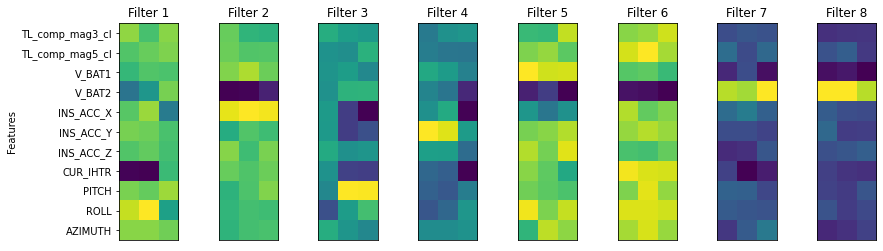

In [22]:
fig = plt.figure(figsize=(14,4))
for i in range(8):
    a = fig.add_subplot(1,8,i+1)
    imgplot = plt.imshow(conv1.weight.cpu().detach().numpy()[i])
    a.set_title(f'Filter {i+1}')
    a.set_xticks([])
    if i == 0:
        a.set_ylabel('Features')
        a.set_yticks(np.arange(0,11))
        a.set_yticklabels(['TL_comp_mag3_cl', 'TL_comp_mag5_cl', 'V_BAT1', 'V_BAT2', 'INS_ACC_X', 'INS_ACC_Y', 'INS_ACC_Z', 'CUR_IHTR', 'PITCH', 'ROLL', 'AZIMUTH'])
    else:
        a.set_yticks([])
plt.show()

In [23]:
test.__getitem__(0)[0].unsqueeze(0).shape

NameError: name 'test' is not defined

In [ ]:
model = torch.load(f'../models/CNN_runs/CNN_220628_014719/CNN.pt')
model.to('cpu')

In [ ]:
model.architecture[0]

In [ ]:
test_loader    = DataLoader(test,
                       batch_size=20000,
                       shuffle=False,
                       num_workers=0,
                       pin_memory=False)

In [24]:
batch = next(iter(test_loader))
seqs, _ = batch
seqs.shape

NameError: name 'test_loader' is not defined

In [25]:
e = shap.GradientExplainer(model,seqs)
varss = seqs[0:250,:,:]
shap_values = e.shap_values(varss)

NameError: name 'seqs' is not defined

In [26]:
shap_values.shape

NameError: name 'shap_values' is not defined

In [27]:
plt.imshow(shap_values[3,:,:])
plt.show()

NameError: name 'shap_values' is not defined

In [28]:
%%capture
%matplotlib inline
plt.rcParams["animation.html"] = "jshtml"
import numpy as np

frames = 250

fig, (ax1,ax2) = plt.subplots(2,1,figsize=[20,5])
ax1.set_yticklabels(['TL_comp_mag3_cl', 'TL_comp_mag5_cl', 'V_BAT1', 'V_BAT2', 'INS_ACC_X', 'INS_ACC_Y', 'INS_ACC_Z', 'CUR_IHTR', 'PITCH', 'ROLL', 'AZIMUTH'])
ax2.plot(np.linspace(0,100+frames-1,100+frames),df7['TL_comp_mag5_cl'][df7.index[0:(100+frames)]])
line, = ax2.plot(np.linspace(0,99,100),df7['TL_comp_mag5_cl'][df7.index[0:100]])

def animate(i):
    ax1.imshow(shap_values[i,:,:])
    line.set_data(np.linspace(i,i+99,100),df7['TL_comp_mag5_cl'][df7.index[i:(i+100)]])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=frames, interval=150)

In [65]:
ani

In [71]:
# writegif = matplotlib.animation.PillowWriter(fps=5)
# ani.save('cnnanim.gif',writer=writegif)

In [150]:
sections = df_concat.LINE.unique().tolist()

In [157]:
res = df_concat[df_concat != sections[3]]